# Working with MEG dataset
MEG dataset from THINGS initiative: https://openneuro.org/datasets/ds004212/versions/2.0.1
### Training data partition
The data is .fif file which needs to be converted into a rather easy to use .npy array.
We will use mne library for this: https://mne.tools/dev/index.html 


We collected extensively sampled object representations using magnetoencephalography (MEG). To this end, we drew on the THINGS database (Hebart et al., 2019), a richly-annotated database of 1,854 object concepts representative of the American English language which contains 26,107 manually-curated naturalistic object images.

ERP = event-related potential; signal with respect to some event
VEP = ERP for visual stimuli



27084 events, 281 time points, 271 channels

## Here we perform NMF experiements. And data matrix as concepts x channes*time

Create clusters of decomposed time components of meg data over multiple seeds.

In [1]:
import numpy as np
import mne, os
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import matplotlib.image as mpimg
import nimfa
import scipy.stats as st
from sklearn.cluster import KMeans
from sklearn.decomposition import NMF

In [2]:
def compute_log_likelihood(V: np.ndarray, W: np.ndarray, H: np.ndarray):
    """Compute log-likelihood."""
    V_hat = np.dot(W, H)
    err_std_dev = np.sqrt(np.var(V - V_hat))
    log_likelihood = st.norm.logpdf(V, loc=V_hat, scale=err_std_dev).sum()
    return log_likelihood

def compute_aic(V: np.ndarray, W: np.ndarray, H: np.ndarray):
    """Compute AIC."""
    log_likelihood = compute_log_likelihood(V, W, H)
    n_free_params = np.count_nonzero(W) + np.count_nonzero(H) + 1
    aic = 2 * n_free_params - 2 * log_likelihood
    return aic, n_free_params

def compute_bic(V: np.ndarray, W: np.ndarray, H: np.ndarray):
    """Compute BIC."""
    log_likelihood = compute_log_likelihood(V, W, H)
    I, J = V.shape
    n_samples = I * J
    n_free_params = np.count_nonzero(W) + np.count_nonzero(H) + 1
    bic = np.log(n_samples) * n_free_params - 2 * log_likelihood
    return bic

In [3]:
def fit_bnmf(V: np.ndarray, k: int):
    bnmf = nimfa.Bd(V, seed='random_c', rank=k, max_iter=500, min_residuals=1e-4, alpha=np.zeros((V.shape[0], k)),
                        beta=np.zeros((k, V.shape[1])), theta=.0, k=.0, sigma=1., skip=100, stride=1,
                        n_w=np.zeros((k, 1)), n_h=np.zeros((k, 1)), n_run=1, n_sigma=False)
    bnmf_fit = bnmf()
    W = bnmf_fit.basis()
    H = bnmf_fit.coef()
    return np.array(W), np.array(H)

def compute_evar_all(V: np.ndarray, W: np.ndarray, H: np.ndarray):
    V_hat = np.dot(W, H)
    rss = np.sum(np.asarray(V_hat - V)**2)
    evar_all = 1. - rss / (V*V).sum()
    return evar_all

def compute_evar_indiv(V: np.ndarray, W: np.ndarray, H: np.ndarray, d: int):
    V_hat_d = np.outer(W[:, d], H[d, :])
    rss = np.sum(np.asarray(V_hat_d - V)**2)
    evar_indiv = 1. - rss / (V*V).sum()
    return evar_indiv

def compute_evar_unique(V: np.ndarray, W: np.ndarray, H: np.ndarray, d: int, evar_all: float):
    V_hat_wo_d = np.dot(W[:, np.arange(W.shape[1]) != d], H[np.arange(H.shape[0]) != d, :])
    rss = np.sum(np.asarray(V_hat_wo_d - V)**2)
    evar_rest = 1. - rss / (V*V).sum()
    evar_unique = evar_all - evar_rest
    return evar_unique

In [4]:
channel_picks = ['O','T','P'] 
preproc_dir = '../data/preprocessed'
image_dir = '../data/'

n_participants = 3
def load_epochs(preproc_dir,all_epochs = []):
    for p in range(1,n_participants+1):
        epochs = mne.read_epochs(f'{preproc_dir}/preprocessed_P{str(p)}-epo.fif', preload=False)
        all_epochs.append(epochs)
    return all_epochs

def plot_erfs(epochs,n_sessions,name):
    ctf_layout = mne.find_layout(epochs.info)
    picks_epochs = [epochs.ch_names[i] for i in np.where([s[2]==name for s in epochs.ch_names])[0]]
    picks = np.where([i[2]==name for i in ctf_layout.names])[0]

    # get evoked data
    for s in range(n_sessions):    
        evoked = epochs[(epochs.metadata['trial_type']=='test') & (epochs.metadata['session_nr']==s+1)].average()
        evoked.pick_channels(ch_names=picks_epochs)
        plt.plot(epochs.times*1000,np.mean(evoked.data.T,axis=1),lw=0.5,alpha=0.4)
    evoked = epochs[(epochs.metadata['trial_type']=='test')].average()
    evoked.pick_channels(ch_names=picks_epochs)

    # plot ERFs for selected sensor group
    plt.plot(epochs.times*1000,np.mean(evoked.data.T,axis=1),lw=1)
    plt.xlim([epochs.times[0]*1000,epochs.times[len(epochs.times)-1]*1000])
    plt.ylim([-0.6,0.6])
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')  
    # plt.['right'].set_visible(False)
    # plt.spines['top'].set_visible(False)

    #  plot sensor locations
    # ax2.plot(ctf_layout.pos[:,0],ctf_layout.pos[:,1],color='gainsboro',marker='.',linestyle='',markersize=5)
    # ax2.plot(ctf_layout.pos[picks,0],ctf_layout.pos[picks,1],color='grey',marker='.',linestyle='',markersize=5)
    # ax2.set_aspect('equal')


In [5]:
all_epochs = load_epochs(preproc_dir)

Reading /home/atharvsagar/Documents/Neural-Representations-using-Things-Database/notebooks/../data/preprocessed/preprocessed_P1-epo.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/atharvsagar/Documents/Neural-Representations-using-Things-Database/notebooks/../data/preprocessed/preprocessed_P1-epo.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/atharvsagar/Documents/Neural-Representations-using-Things-Database/notebooks/../data/preprocessed/preprocessed_P1-epo.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/atharvsagar/Documents/Neural-Representations-using-Things-Database/notebooks/../data/preprocessed/preprocessed_P1-epo.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy functi

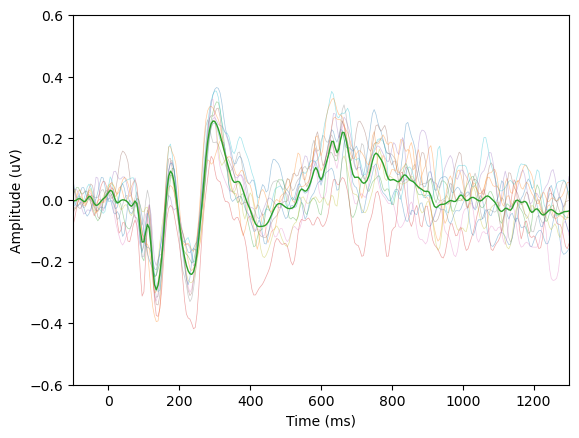

In [6]:
n_sessions = 12
plot_erfs(all_epochs[1],n_sessions,'O')

In [7]:
epochs = all_epochs[2]

In [8]:
epochs.metadata

,trial_type,image_nr,category_nr,exemplar_nr,test_image_nr,things_category_nr,things_image_nr,things_exemplar_nr,image_path,onset,image_on,image_off,responded,key_id,key_time,RT,session_nr,run_nr
0,exp,66,6,6,NaN,6.0,77.0,6.0,images_meg/air_mattress/air_mattress_06s.jpg,3.00,3.007379,3.507551,0,NaN,NaN,NaN,1,1
1,exp,19722,1644,6,NaN,1644.0,23212.0,6.0,images_meg/tent/tent_06s.jpg,4.60,4.608000,5.108164,0,NaN,NaN,NaN,1,1
2,exp,9990,833,6,NaN,833.0,11909.0,6.0,images_meg/iron/iron_06s.jpg,5.90,6.158647,6.658820,0,NaN,NaN,NaN,1,1
3,exp,18114,1510,6,NaN,1510.0,21355.0,6.0,images_meg/speaker/speaker_06s.jpg,7.55,7.559094,8.059242,0,NaN,NaN,NaN,1,1
4,exp,21630,1803,6,NaN,1803.0,25403.0,6.0,images_meg/weed/weed_06s.jpg,9.05,9.109738,9.609925,0,NaN,NaN,NaN,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27043,test,22509,874,13,61.0,874.0,12520.0,14.0,images_test_meg/kimono_14s.jpg,333.25,333.271450,333.771659,0,NaN,NaN,NaN,12,10
27044,exp,1928,161,8,NaN,161.0,2461.0,8.0,images_meg/bomb/bomb_08s.jpg,334.60,334.821982,335.322292,0,NaN,NaN,NaN,12,10
27045,exp,12380,1032,8,NaN,1032.0,14716.0,8.0,images_meg/mouth/mouth_08s.jpg,335.90,336.189182,336.689494,0,NaN,NaN,NaN,12,10
27046,exp,4736,395,8,NaN,395.0,5685.0,8.0,images_meg/computer/computer_08s.jpg,337.45,337.473051,337.973265,0,NaN,NaN,NaN,12,10


In [9]:
NOS_CONCEPTS = 1854
NOS_IMAGE_PER_CONCEPT = 12
NOS_TIME_POINTS = 281
OPTICAL_CHANNELS = 1
time_points = epochs.times
name = channel_picks[0]
print(name, channel_picks)
# ctf_layout = mne.find_layout(epochs.info)
picks_epochs = [epochs.ch_names[i] for i in np.where([s[2]==name for s in epochs.ch_names])[0]]
ep1 = epochs[epochs.metadata['trial_type']=='exp']  
ep1.load_data() 
if OPTICAL_CHANNELS:
    NOS_CHANNELS_OPT = 39
    ep1.pick_channels(ch_names=picks_epochs); # supress output
else:
    NOS_CHANNELS_OPT = 271

O ['O', 'T', 'P']


Loading data for 22248 events and 281 original time points ...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [10]:
ep1.metadata

,trial_type,image_nr,category_nr,exemplar_nr,test_image_nr,things_category_nr,things_image_nr,things_exemplar_nr,image_path,onset,image_on,image_off,responded,key_id,key_time,RT,session_nr,run_nr
0,exp,66,6,6,NaN,6.0,77.0,6.0,images_meg/air_mattress/air_mattress_06s.jpg,3.00,3.007379,3.507551,0,NaN,NaN,NaN,1,1
1,exp,19722,1644,6,NaN,1644.0,23212.0,6.0,images_meg/tent/tent_06s.jpg,4.60,4.608000,5.108164,0,NaN,NaN,NaN,1,1
2,exp,9990,833,6,NaN,833.0,11909.0,6.0,images_meg/iron/iron_06s.jpg,5.90,6.158647,6.658820,0,NaN,NaN,NaN,1,1
3,exp,18114,1510,6,NaN,1510.0,21355.0,6.0,images_meg/speaker/speaker_06s.jpg,7.55,7.559094,8.059242,0,NaN,NaN,NaN,1,1
4,exp,21630,1803,6,NaN,1803.0,25403.0,6.0,images_meg/weed/weed_06s.jpg,9.05,9.109738,9.609925,0,NaN,NaN,NaN,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27042,exp,18668,1556,8,NaN,1556.0,21982.0,8.0,images_meg/stilt/stilt_08s.jpg,331.70,331.837559,332.337755,0,NaN,NaN,NaN,12,10
27044,exp,1928,161,8,NaN,161.0,2461.0,8.0,images_meg/bomb/bomb_08s.jpg,334.60,334.821982,335.322292,0,NaN,NaN,NaN,12,10
27045,exp,12380,1032,8,NaN,1032.0,14716.0,8.0,images_meg/mouth/mouth_08s.jpg,335.90,336.189182,336.689494,0,NaN,NaN,NaN,12,10
27046,exp,4736,395,8,NaN,395.0,5685.0,8.0,images_meg/computer/computer_08s.jpg,337.45,337.473051,337.973265,0,NaN,NaN,NaN,12,10


In [11]:
ep1.metadata['session_nr']

0         1
1         1
2         1
3         1
4         1
         ..
27042    12
27044    12
27045    12
27046    12
27047    12
Name: session_nr, Length: 22248, dtype: int64

In [12]:
print(ep1.metadata['category_nr'].values - 1)
print(ep1._data.shape)
ep1[(ep1.metadata['category_nr'] == 1) & (ep1.metadata['session_nr'] == 1)]._data.shape


[   5 1643  832 ... 1031  394 1025]
(22248, 39, 281)


(1, 39, 281)

In [13]:
# Initialize the concept_epochs array with zeros
concept_epochs = np.zeros((NOS_IMAGE_PER_CONCEPT, NOS_CONCEPTS, NOS_TIME_POINTS, NOS_CHANNELS_OPT))
category_nrs = ep1.metadata['category_nr'].to_numpy()
session_nrs = ep1.metadata['session_nr'].to_numpy()

# Precompute masks for categories and sessions
category_masks = [(category_nrs == (cat_nr + 1)) for cat_nr in range(NOS_CONCEPTS)]
session_masks = [(session_nrs == (img_nr + 1)) for img_nr in range(NOS_IMAGE_PER_CONCEPT)]

# Fill concept_epochs efficiently
for category_nr, category_mask in enumerate(category_masks):
    for img_nr, session_mask in enumerate(session_masks):
        mask = category_mask & session_mask
        concept_epochs[img_nr, category_nr, :, :] = ep1._data[mask].transpose(0, 2, 1)

In [14]:
time_window = [0 , 0.8]
concept_epochs = concept_epochs[:, :, (time_points >= time_window[0]) & (time_points <= time_window[1]), :]
time_points = time_points[(time_points >= time_window[0]) & (time_points <= time_window[1])]
NOS_TIME_POINTS = concept_epochs.shape[2]
average_concept_epochs = concept_epochs.mean(axis = 0)
print(average_concept_epochs.shape, concept_epochs.shape)


(1854, 161, 39) (12, 1854, 161, 39)


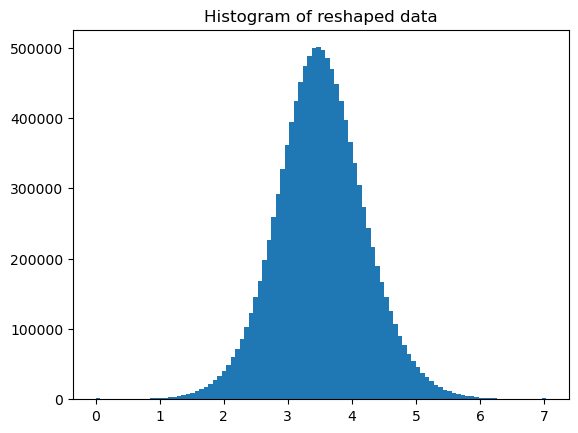

(1854, 161, 39)

In [15]:

temp = average_concept_epochs[:,:,:] - average_concept_epochs.mean(axis = (0,1)) # making sure each channel is centered
# set outlier points to max value 
dev = 5*np.std(temp)
temp[temp > dev] = dev
temp[temp < - dev] = - dev
temp = temp - np.min(temp)
plt.hist(temp.flatten(), bins = 100)
plt.title("Histogram of reshaped data")
plt.show()
temp.shape

In [16]:
# plt.title("Making sure reshaping keeps time data constant")
# plt.plot(time_points, X[0, :NOS_TIME_POINTS], label = 'reshaped data')
# plt.plot(time_points, average_concept_epochs[0, :, 0], label = 'original data')
# plt.legend()
# plt.show()

Trying NMF on a few time points


### NMF 

In [17]:
# X = temp.transpose(0,2,1).reshape(NOS_CONCEPTS, NOS_TIME_POINTS * NOS_CHANNELS_OPT) 
# X = X - X.min()

# num_commponents = [2, 5, 10, 20, 50, 100, 150, 200]
# W_array = []
# H_array = []
# AIC_array = []
# BIC_array = []

# for k in tqdm(num_commponents):
#     W, H = fit_bnmf(X, k)
#     W_array.append(W)
#     H_array.append(H)
#     aic, _ = compute_aic(X, W, H)
#     bic = compute_bic(X, W, H)
#     AIC_array.append(aic)
#     BIC_array.append(bic)
#     print(f'k = {k}, AIC = {aic}, BIC = {bic}')


In [18]:

# plt.figure()    
# # for k in range(len(num_commponents)):
# plt.plot(num_commponents, AIC_array, label = 'AIC') 
# plt.plot(num_commponents, BIC_array, label = 'BIC')
# plt.xlabel('Number of components')
# plt.ylabel('Information Criterion')
# plt.legend()
# plt.show()



In [ ]:
X = temp.transpose(0,2,1).reshape(NOS_CONCEPTS, NOS_TIME_POINTS * NOS_CHANNELS_OPT) 
X = X - X.min()
X.shape


(1854, 6279)

In [20]:

images_to_show = 20
nmf_components = 20
nos_seeds = 1
seeds = np.random.randint(0, 100, nos_seeds)
print(seeds)

# make a array to store the W and H values for each seed
W_array = []
H_array = []
for seed in seeds:
    BAYESIAN = False
    if BAYESIAN:
        W, H = fit_bnmf(X, nmf_components)
        # X_pred = np.dot(W, H)
    else:
        model = NMF(n_components=nmf_components, random_state=seed)
        model.init = 'random'  
        W = model.fit_transform(X)
        H = model.components_
        # X_pred = np.dot(W, H)
    W_array.append(W)
    H_array.append(H)

                   
# model = NMF(n_components=nmf_components, random_state=40)
# model.init = 'random'   
# W = model.fit_transform(X)
# H = model.components_
# X_pred = np.dot(W, H)
print(X.shape, W.shape, H.shape)

[83]


(1854, 6279) (1854, 20) (20, 6279)


/home/atharvsagar/anaconda3/lib/python3.12/site-packages/sklearn/decomposition/_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


In [21]:
comp_vs_time_array = np.zeros((len(seeds), nmf_components, NOS_CHANNELS_OPT, NOS_TIME_POINTS))

for i in range(len(seeds)):
    H = H_array[i]
    comp_vs_time_array[i, :, :, :] = H.reshape(nmf_components, NOS_CHANNELS_OPT, NOS_TIME_POINTS)


In [22]:
comp_vs_time_array.shape

(1, 20, 39, 161)

In [23]:
# kmeans = KMeans(n_clusters = 4, random_state=0)
# kmeans.fit(comp_vs_time_array.reshape(len(seeds)*nmf_components, NOS_CHANNELS_OPT*NOS_TIME_POINTS))

In [24]:
# # visualize clustering results
# fig, axs = plt.subplots(4, 1, figsize=(10, 10))
# im_list = []  # to store imshow objects

# for i in range(4):
#     im = axs[i].imshow(kmeans.cluster_centers_[i].reshape(NOS_CHANNELS_OPT, NOS_TIME_POINTS), cmap='viridis')
#     axs[i].set_title(f'Cluster {i}')
#     axs[i].set_xticks([])
#     im_list.append(im)  # store the image object
#     axs[i].set_ylabel('Channels')
# plt.xticks(range(0,NOS_TIME_POINTS, 20), time_points[::20])
# # Add a single colorbar for all subplots
# cbar = fig.colorbar(im_list[0], ax=axs, orientation='vertical', fraction=0.02, pad=0.04)
# cbar.set_label('Intensity')
# plt.xlabel('Time (s)')
# plt.show()


In [25]:

# plt.figure(figsize=(20, 5)) 
# # plt.plot(time_points, average_concept_epochs[0, :, 0], label = 'original data', linewidth=2)
# # plt.plot(time_points, comp_vs_time[:, 0,:].sum(axis=0), label = 'NMF reconstruction', linewidth=2)
# for i in range(nmf_components):
#     plt.plot(time_points, comp_vs_time[i, 0,:], alpha=0.5, label=f'Component {i}')   
#     # plt.plot(time_points, comp_vs_time[i, 0,:] - comp_vs_time[i,0,:20].mean(), alpha=0.2, label=f'Component {i}')
# plt.title(f"Components vs time for participant {n_participants} and seed {seed}")
# plt.xlabel("Time")
# plt.ylabel("Component value")
# plt.legend()
# plt.show()


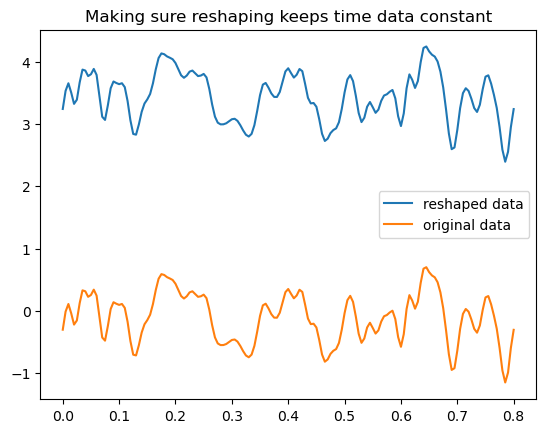

In [26]:
plt.title("Making sure reshaping keeps time data constant")
plt.plot(time_points, X[0, :NOS_TIME_POINTS], label = 'reshaped data')
plt.plot(time_points, average_concept_epochs[0, :, 0], label = 'original data')
plt.legend()
plt.show()

Categories which are best on component 0 are: [ 206 1280 1077  429  768 1167  450 1288  412 1271  385 1793  914  480
   51 1418 1412 1037  203 1701]
Categories which are best on component 1 are: [ 661  243 1764  926  238   36 1191 1433 1205  879  672 1493 1799  809
  370  516  249  671  699 1742]
Categories which are best on component 2 are: [1079 1632 1043 1216  231 1044 1132  179 1361  809  232  896  830 1434
 1665 1566 1111 1246  106 1423]
Categories which are best on component 3 are: [ 437 1792  526   11  582 1093 1590 1703    6  979 1589 1555 1234  500
  323 1372  564 1824 1131 1803]
Categories which are best on component 4 are: [ 662  743 1819  343 1784  818 1832  259 1271  506  979  717  875  292
  338   61 1058  870 1361  822]
Categories which are best on component 5 are: [ 978  878  106   34   67  844  435  123  756 1258  761  470  989 1152
 1584 1644 1723  111 1475  498]
Categories which are best on component 6 are: [ 985 1762 1798 1537 1599 1498 1844 1214  760  637  278  348

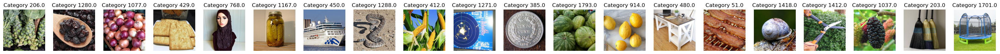

Component 1 is best loaded by the following image categories:


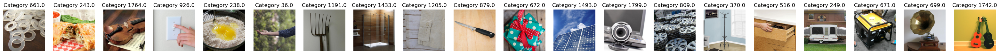

Component 2 is best loaded by the following image categories:


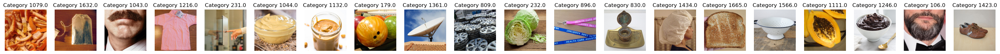

Component 3 is best loaded by the following image categories:


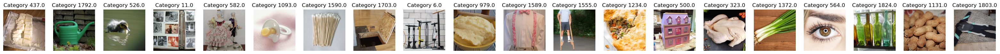

Component 4 is best loaded by the following image categories:


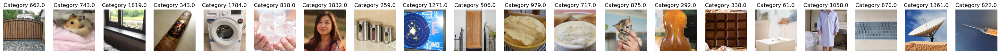

Component 5 is best loaded by the following image categories:


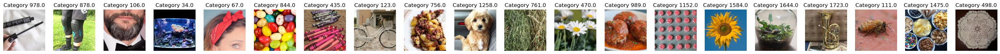

Component 6 is best loaded by the following image categories:


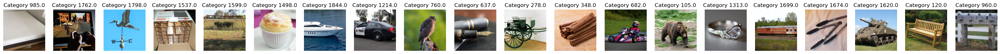

Component 7 is best loaded by the following image categories:


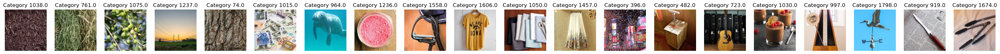

Component 8 is best loaded by the following image categories:


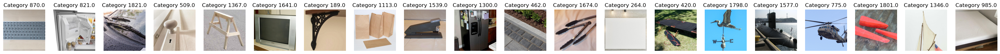

Component 9 is best loaded by the following image categories:


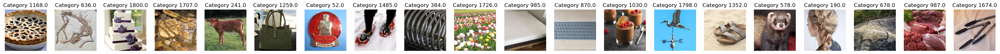

Component 10 is best loaded by the following image categories:


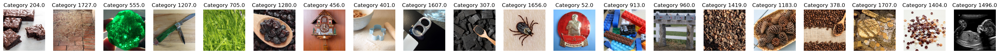

Component 11 is best loaded by the following image categories:


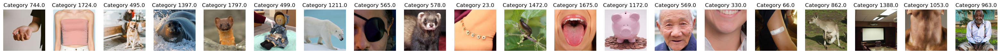

Component 12 is best loaded by the following image categories:


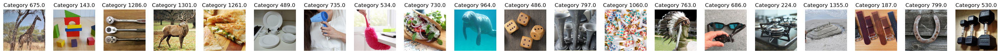

Component 13 is best loaded by the following image categories:


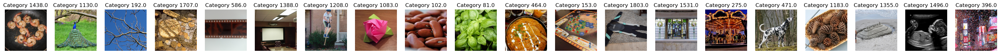

Component 14 is best loaded by the following image categories:


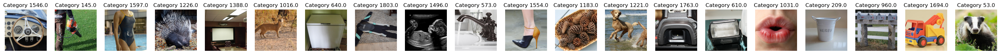

Component 15 is best loaded by the following image categories:


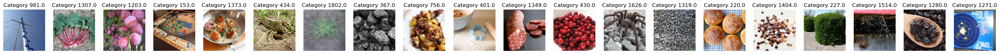

Component 16 is best loaded by the following image categories:


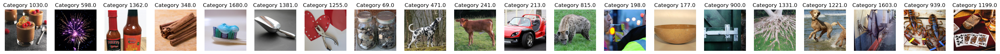

Component 17 is best loaded by the following image categories:


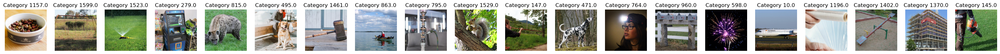

Component 18 is best loaded by the following image categories:


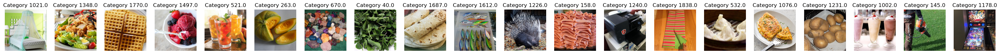

Component 19 is best loaded by the following image categories:


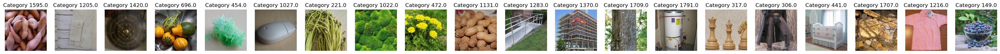

In [27]:

nmf_components_vs_category = np.zeros((nmf_components, images_to_show))
for i in range(nmf_components):
    sorted_indices = np.argsort(W[:,i])
    print(f'Categories which are best on component {i} are: {sorted_indices[-images_to_show:]}')
    nmf_components_vs_category[i,:] = sorted_indices[-images_to_show:]
# plot images for the top 5 categories for each component  
category_array_name = []
for component in range(nmf_components):
    if component > 20:
        break
    print(f"Component {component} is best loaded by the following image categories:")
    category_array = []
    fig, axs = plt.subplots(1, images_to_show, figsize=(40, 40))
    for i in range(images_to_show):
        category_nr = nmf_components_vs_category[component, i] 
        # Get the image paths for the given category_nr
        image_paths = epochs.metadata[(epochs.metadata['category_nr'] == category_nr+1) & (epochs.metadata['trial_type'] == 'exp')]['image_path']
        image_path = image_paths.iloc[0]
        image_path = f'{image_dir}{image_path}'
        img = mpimg.imread(image_path)
        category_array.append(image_path.split('/')[-2])
        axs[i].imshow(img)
        axs[i].set_title(f"Category {category_nr}")
        axs[i].axis('off')
    plt.show()
    category_array_name.append(category_array)

In [28]:
category_array_name

[['brussels_sprouts',
  'raisin',
  'onion',
  'cracker',
  'headscarf',
  'pickle',
  'cruise_ship',
  'rattlesnake',
  'corn',
  'radar',
  'coin',
  'watermelon',
  'lemon',
  'desk',
  'bacon',
  'shell2',
  'shears',
  'mulberry',
  'broom',
  'trampoline'],
 ['gasket',
  'calzone',
  'violin',
  'light_switch',
  'cake_mix',
  'arm',
  'pitchfork',
  'shower',
  'pocket',
  'knife',
  'gift',
  'solar_panel',
  'webcam',
  'hubcap',
  'coat_rack',
  'drawer',
  'camper',
  'generator',
  'gramophone',
  'ukulele'],
 ['orange_rind',
  'teabag',
  'mustache',
  'polo_shirt',
  'button2',
  'mustard',
  'peanut_butter',
  'bowling_ball',
  'satellite_dish',
  'hubcap',
  'cabbage',
  'lanyard',
  'inkwell',
  'shower_cap',
  'toast',
  'strainer',
  'papaya',
  'pudding',
  'beard',
  'shoe'],
 ['cream_cheese',
  'watering_can',
  'duckling',
  'album',
  'figurine',
  'pacifier',
  'swab',
  'trapdoor',
  'air_pump',
  'mashed_potato',
  'suspenders',
  'stilt',
  'potpie',
  'doll

### Time dynamics
To see how each component evolves with time

In [29]:
print(H.shape)
comp_vs_time = H.reshape(nmf_components, NOS_CHANNELS_OPT, NOS_TIME_POINTS)


(20, 6279)


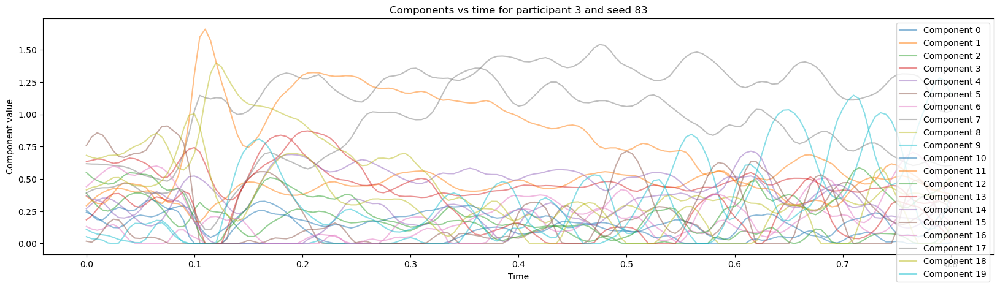

In [30]:
   
plt.figure(figsize=(20, 5)) 
# plt.plot(time_points, average_concept_epochs[0, :, 0], label = 'original data', linewidth=2)
# plt.plot(time_points, comp_vs_time[:, 0,:].sum(axis=0), label = 'NMF reconstruction', linewidth=2)
for i in range(nmf_components):
    plt.plot(time_points, comp_vs_time[i, 0,:], alpha=0.5, label=f'Component {i}')   
    # plt.plot(time_points, comp_vs_time[i, 0,:] - comp_vs_time[i,0,:20].mean(), alpha=0.2, label=f'Component {i}')
plt.title(f"Components vs time for participant {n_participants} and seed {seed}")
plt.xlabel("Time")
plt.ylabel("Component value")
plt.legend()
plt.show()

In [31]:
# similarity matrix instead of reconstructing data matrix 

In [32]:
# correlation of dimensions with the categories

In [33]:
times = [-0.1,0.0, 0.170, 0.320, 0.5, 0.75, 1, 1.2]
nmf_components = 4 # 3 mins for 30 components

for time in times:
    index = epochs.times == time
    X = average_concept_epochs[:, index, :].squeeze()
    X += abs(X.min())
    model = NMF(n_components=nmf_components)
    W = model.fit_transform(X)
    H = model.components_
    X_pred = np.dot(W, H)   
    nmf_components_vs_category = np.zeros((nmf_components, 10))
    print(f'For time {time*1000} ms')
    for i in range(nmf_components):
        sorted_indices = np.argsort(W[:,i])
        # print(f'Categories which are best on component {i} are: {sorted_indices[-10:]}')
        nmf_components_vs_category[i,:] = sorted_indices[-10:]
    # plot images for the top 5 categories for each component   
    for component in range(nmf_components):
        if component > 20:
            break
        print(f"Component {component} is best loaded by the following image categories:")
        # fig, axs = plt.subplots(1, 10, figsize=(20, 20))
        for i in range(10):
            category_nr = nmf_components_vs_category[component, i] 
            # Get the image paths for the given category_nr
            image_paths = epochs.metadata[(epochs.metadata['category_nr'] == category_nr) & (epochs.metadata['trial_type'] == 'exp')]['image_path']
            print(image_paths)
            # print(image_paths.iloc[0])
            # image_path = image_paths.iloc[0]
            # image_path = f'../{image_path}'
            # img = mpimg.imread(image_path)
            # axs[i].imshow(img)
            # axs[i].set_title(f"Category {category_nr}")
            # axs[i].axis('off')
        # plt.show()

IndexError: boolean index did not match indexed array along dimension 1; dimension is 161 but corresponding boolean dimension is 281